# CMIP6 Temperature Changes

Description: The goal is to build a data structure of temperature changes across the model ensemble. We will build one for global time-series and one for spatially-resolved trends.

# Preprocessing Data

## Task 1: Global Temperature Changes

In [1]:
#imports
from matplotlib import pyplot as plt
from matplotlib.lines import Line2D 
from scipy import stats
import cftime
import numpy as np
import pandas as pd
import xarray as xr
import zarr
import gcsfs
import cartopy
import cartopy.crs as ccrs
import cartopy.feature as cfeature

In [2]:
df = pd.read_csv('https://storage.googleapis.com/cmip6/cmip6-zarr-consolidated-stores.csv')
df.head()

,activity_id,institution_id,source_id,experiment_id,member_id,table_id,variable_id,grid_label,zstore,dcpp_init_year,version
0,HighResMIP,CMCC,CMCC-CM2-HR4,highresSST-present,r1i1p1f1,Amon,ps,gn,gs://cmip6/CMIP6/HighResMIP/CMCC/CMCC-CM2-HR4/...,NaN,20170706
1,HighResMIP,CMCC,CMCC-CM2-HR4,highresSST-present,r1i1p1f1,Amon,rsds,gn,gs://cmip6/CMIP6/HighResMIP/CMCC/CMCC-CM2-HR4/...,NaN,20170706
2,HighResMIP,CMCC,CMCC-CM2-HR4,highresSST-present,r1i1p1f1,Amon,rlus,gn,gs://cmip6/CMIP6/HighResMIP/CMCC/CMCC-CM2-HR4/...,NaN,20170706
3,HighResMIP,CMCC,CMCC-CM2-HR4,highresSST-present,r1i1p1f1,Amon,rlds,gn,gs://cmip6/CMIP6/HighResMIP/CMCC/CMCC-CM2-HR4/...,NaN,20170706
4,HighResMIP,CMCC,CMCC-CM2-HR4,highresSST-present,r1i1p1f1,Amon,psl,gn,gs://cmip6/CMIP6/HighResMIP/CMCC/CMCC-CM2-HR4/...,NaN,20170706


In [3]:
gcs = gcsfs.GCSFileSystem(token='anon')

In [4]:
df_tas_hist=df.query  ("activity_id=='CMIP'         & table_id == 'Amon' & variable_id == 'tas' & experiment_id=='historical'& member_id=='r1i1p1f1'")
df_tas_ssp585=df.query("activity_id=='ScenarioMIP'  & table_id == 'Amon' & variable_id == 'tas' & experiment_id=='ssp585'    & member_id=='r1i1p1f1'")

#  assemble a set of models (source_id) for each experiment + variable combination
models_tas_hist  =set(df_tas_hist.source_id)    # all models that have temperature in the historical simulations
models_tas_ssp585=set(df_tas_ssp585.source_id)  # all models that have temperature in the ssp585     simulations

# let's only keep the models that have all the runs (the intersection of the set)
source_set = set.intersection(models_tas_hist, models_tas_ssp585)
source_list=list(source_set)
print(len(models_tas_hist))
print(len(models_tas_ssp585))
print(len(source_list))

55
35
35


In [5]:
source_list.remove('MPI-ESM1-2-LR')
source_list.remove('MPI-ESM1-2-HR')
source_list.remove('AWI-CM-1-1-MR')
print(len(source_list))

32


In [6]:
source_list

['CanESM5',
 'EC-Earth3-Veg-LR',
 'KIOST-ESM',
 'EC-Earth3-CC',
 'CESM2-WACCM',
 'IITM-ESM',
 'EC-Earth3-Veg',
 'CIESM',
 'CMCC-ESM2',
 'TaiESM1',
 'CAMS-CSM1-0',
 'GFDL-CM4',
 'GFDL-ESM4',
 'NorESM2-MM',
 'FIO-ESM-2-0',
 'BCC-CSM2-MR',
 'FGOALS-f3-L',
 'IPSL-CM6A-LR',
 'FGOALS-g3',
 'EC-Earth3',
 'MIROC6',
 'INM-CM5-0',
 'E3SM-1-1',
 'NESM3',
 'NorESM2-LM',
 'KACE-1-0-G',
 'ACCESS-ESM1-5',
 'MRI-ESM2-0',
 'CMCC-CM2-SR5',
 'ACCESS-CM2',
 'CAS-ESM2-0',
 'INM-CM4-8']

In [7]:
def load_zarr_dset(df):
  # get the path to a specific zarr store (the first one from the dataframe above)
  zstore = df.zstore.values[-1]

  # create a mutable-mapping-style interface to the store
  mapper = gcs.get_mapper(zstore)

  # open it using xarray and zarr
  ds = xr.open_zarr(mapper, consolidated=True)
  return ds

In [8]:
#time index to assign model times to
new_time_index=pd.date_range('1850-01-01', '2099-12-31', freq='ME')
new_time_index

DatetimeIndex(['1850-01-31', '1850-02-28', '1850-03-31', '1850-04-30',
               '1850-05-31', '1850-06-30', '1850-07-31', '1850-08-31',
               '1850-09-30', '1850-10-31',
               ...
               '2099-03-31', '2099-04-30', '2099-05-31', '2099-06-30',
               '2099-07-31', '2099-08-31', '2099-09-30', '2099-10-31',
               '2099-11-30', '2099-12-31'],
              dtype='datetime64[ns]', length=3000, freq='ME')

### 1.1 Loading One Model (CanESM5)

In [9]:
#load one model
df_tas_hist_canesm5=df.query  ("activity_id=='CMIP' & source_id == 'CanESM5' & table_id == 'Amon' & variable_id == 'tas' & experiment_id=='historical'& member_id=='r1i1p1f1'")
df_tas_ssp585_canesm5=df.query("activity_id=='ScenarioMIP' & source_id == 'CanESM5' & table_id == 'Amon' & variable_id == 'tas' & experiment_id=='ssp585'    & member_id=='r1i1p1f1'")
df_tas_hist_canesm5
df_tas_ssp585_canesm5

,activity_id,institution_id,source_id,experiment_id,member_id,table_id,variable_id,grid_label,zstore,dcpp_init_year,version
94452,ScenarioMIP,CCCma,CanESM5,ssp585,r1i1p1f1,Amon,tas,gn,gs://cmip6/CMIP6/ScenarioMIP/CCCma/CanESM5/ssp...,NaN,20190429


In [10]:
ds_hist_tas_canesm5 = load_zarr_dset(df_tas_hist_canesm5)
ds_ssp585_tas_canesm5 = load_zarr_dset(df_tas_ssp585_canesm5)
#finding the historical/predicted mean using xarray dataset
ds_hist_tas_canesm5_mean = ds_hist_tas_canesm5.mean('time')
ds_ssp585_tas_canesm5_mean = ds_ssp585_tas_canesm5.mean('time')
ds_hist_tas_canesm5_mean

<xarray.Dataset>
Dimensions:   (lat: 64, bnds: 2, lon: 128)
Coordinates:
    height    float64 ...
  * lat       (lat) float64 -87.86 -85.1 -82.31 -79.53 ... 82.31 85.1 87.86
    lat_bnds  (lat, bnds) float64 dask.array<chunksize=(64, 2), meta=np.ndarray>
  * lon       (lon) float64 0.0 2.812 5.625 8.438 ... 348.8 351.6 354.4 357.2
    lon_bnds  (lon, bnds) float64 dask.array<chunksize=(128, 2), meta=np.ndarray>
Dimensions without coordinates: bnds
Data variables:
    tas       (lat, lon) float32 dask.array<chunksize=(64, 128), meta=np.ndarray>

In [11]:
#load the temperature data
tas_hist_canesm5 = ds_hist_tas_canesm5.tas
tas_ssp585_canesm5 = ds_ssp585_tas_canesm5.tas
#find the weights of the area of the grid cells
weights_1_canesm5 = np.cos(np.deg2rad(tas_hist_canesm5.lat))
weights_2_canesm5 = np.cos(np.deg2rad(tas_ssp585_canesm5.lat))
#mean of the weighted historical and predicted

ds_hist_tas_canesm5_w_mean = tas_hist_canesm5.weighted(weights_1_canesm5).mean(dim = ('lon', 'lat'))
ds_ssp585_tas_canesm5_w_mean = tas_ssp585_canesm5.weighted(weights_2_canesm5).mean(dim = ('lon', 'lat'))
ds_hist_tas_canesm5_w_mean
ds_ssp585_tas_canesm5_w_mean
ds_tas_canesm5_merged = xr.merge([ds_hist_tas_canesm5_w_mean, ds_ssp585_tas_canesm5_w_mean], compat = 'override')
ds_tas_canesm5_merged

<xarray.Dataset>
Dimensions:  (time: 5412)
Coordinates:
  * time     (time) object 1850-01-16 12:00:00 ... 2300-12-16 12:00:00
    height   float64 2.0
Data variables:
    tas      (time) float64 dask.array<chunksize=(600,), meta=np.ndarray>

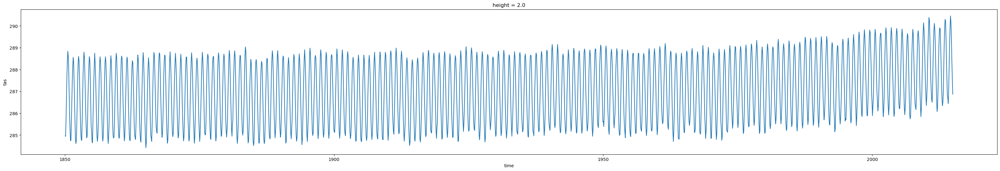

In [73]:
#plot time-series of global temperatures
fig, ax = plt.subplots(figsize = (40,6))
ds_tas_canesm5_merged.tas.plot(ax=ax)

### 1.2 Loading Multiple Models

In [10]:
#GCM picked out
gcm_list = ['NorESM2-MM',
 'ACCESS-CM2',
 'MPI-ESM1-2-HR',
 'KACE-1-0-G',
 'FGOALS-f3-L']

In [12]:
ds_list2 = list()
for source in gcm_list:
    df_hist_tas=df.query  ("activity_id=='CMIP'         & table_id == 'Amon' & variable_id == 'tas' & "
                           "experiment_id=='historical'& member_id=='r1i1p1f1' & source_id== @source")
    df_ssp585_tas=df.query("activity_id=='ScenarioMIP'  & table_id == 'Amon' & variable_id == 'tas' & "
                           "experiment_id=='ssp585'    & member_id=='r1i1p1f1' & source_id== @source")
    ds_hist_tas   =load_zarr_dset(df_hist_tas)
    ds_ssp585_tas =load_zarr_dset(df_ssp585_tas)
    #concat data
    ds_all = xr.concat([ds_hist_tas, ds_ssp585_tas], dim = ('time'), coords='all', compat = 'override')
    #global mean w weights
    weights = np.cos(np.deg2rad(ds_all.tas.lat))
    ds_all = ds_all.weighted(weights).mean(dim=('lon', 'lat'))
    #slice to specific period and reassign new time index
    ds_all = ds_all.isel(time=slice(0,3000))
    ds_all = ds_all.assign(time=new_time_index)
    ds_all = ds_all.assign_coords(model=source) #creates model coordinate for the source
    #add to list
    ds_list2.append(ds_all)
ob_all2 = xr.concat(ds_list2, dim = 'model', coords = 'minimal',compat='override')
ob_all2

C:\Users\panda\miniconda3\envs\temp_var\Lib\site-packages\xarray\coding\times.py:724: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
C:\Users\panda\miniconda3\envs\temp_var\Lib\site-packages\xarray\coding\times.py:724: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
C:\Users\panda\miniconda3\envs\temp_var\Lib\site-packages\xarray\core\indexing.py:557: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  array = array.get_duck_array()


<xarray.Dataset>
Dimensions:  (time: 3000, model: 5)
Coordinates:
    height   (time) float64 2.0 2.0 2.0 2.0 2.0 2.0 ... 2.0 2.0 2.0 2.0 2.0 2.0
  * time     (time) datetime64[ns] 1850-01-31 1850-02-28 ... 2099-12-31
  * model    (model) <U13 'NorESM2-MM' 'ACCESS-CM2' ... 'FGOALS-f3-L'
Data variables:
    tas      (model, time) float64 dask.array<chunksize=(1, 241), meta=np.ndarray>

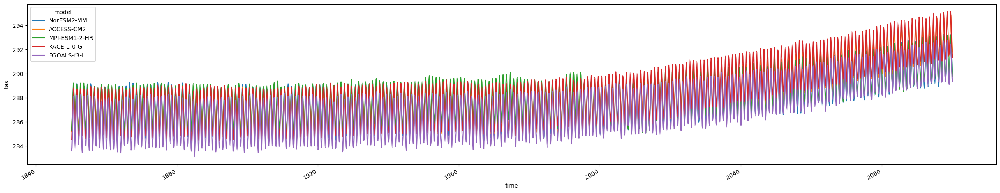

In [14]:
fig, ax = plt.subplots(figsize = (30,5))
lines = ob_all2.tas.plot.line(ax=ax,hue='model', add_legend=True) #accesses tas variable and has each model number set as a diff color

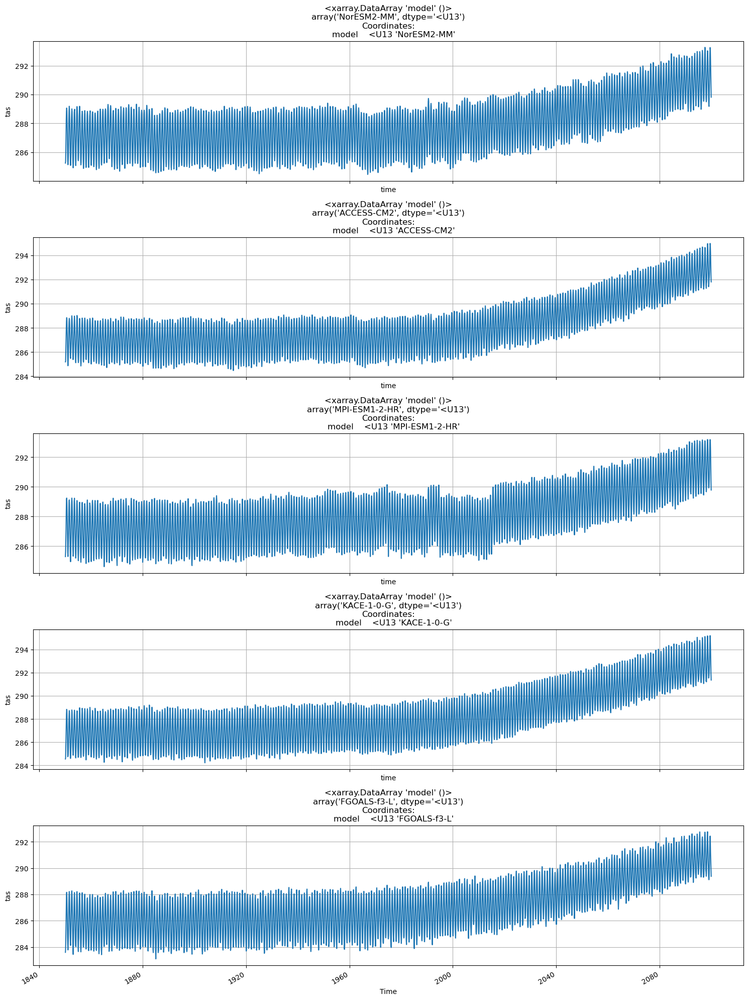

In [15]:
fig, axs = plt.subplots(5, 1, figsize=(15, 20), sharex=True)
for i, model in enumerate(ob_all2.model): #enumerate returns iterator of pairs, each pair contains the index and the corresponding element from the iterable
    ob_all2.sel(model=model).tas.plot(ax=axs[i], label=model) #selects each model and the tas variable, plots over each axes
    axs[i].set_title(model) #shows what model number
    axs[i].set_ylabel('tas')
    axs[i].grid(True) #makes gridlines on plot
axs[-1].set_xlabel('Time') 
plt.tight_layout() #creates a better layout for subplots
plt.show()

#### Trying to Fix Model 'MPI-ESM1-2-LR' 

In [82]:
temp_ob_2060 = ob_all2.tas.sel(time = slice('2060', '2099'))
temp_model_2_2060 = (temp_ob_2060.model == 'MPI-ESM1-2-LR').values
temp_model_2_2060

array([False, False,  True, False, False])

In [83]:
df_hist_tas_temp=df.query  ("activity_id=='CMIP'         & table_id == 'Amon' & variable_id == 'tas' & experiment_id=='historical'& member_id=='r1i1p1f1' & source_id== 'MPI-ESM1-2-LR'")
df_ssp585_tas_temp=df.query("activity_id=='ScenarioMIP'  & table_id == 'Amon' & variable_id == 'tas' & experiment_id=='ssp585'    & member_id=='r1i1p1f1' & source_id== 'MPI-ESM1-2-LR'")
ds_hist_tas_temp   =load_zarr_dset(df_hist_tas)
ds_ssp585_tas_temp =load_zarr_dset(df_ssp585_tas)
#concat data
ds_all_temp = xr.concat([ds_hist_tas, ds_ssp585_tas], dim = ('time'), coords='all', compat = 'override')
#global mean w weights
weights = np.cos(np.deg2rad(ds_all_temp.tas.lat))
ds_all_temp = ds_all_temp.weighted(weights).mean(dim=('lon', 'lat'))
#slice to specific period and reassign new time index
ds_all_temp = ds_all_temp.isel(time=slice(0,3000))
ds_all_temp = ds_all_temp.assign(time=new_time_index)
ds_all_temp = ds_all_temp.sel(time=slice('2080','2099'))
model_2_temp = list(ds_all_temp.tas.values)

Text(0.5, 1.0, 'MPI-ESM1-2-LR Model from 2080 to 2100')

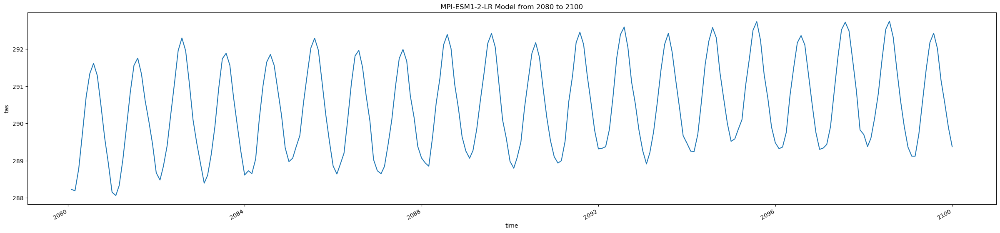

In [84]:
fig, ax = plt.subplots(figsize = (30,6))
ds_all_temp.tas.plot(ax=ax)
ax.set_title('MPI-ESM1-2-LR Model from 2080 to 2100')

In [85]:
ds_temp_temp = ob_all.tas.sel(time = slice('2080', '2099'))
tas_temp_list = np.array(ds_temp_temp.values)
tas_temp_list

array([[288.42165964, 288.47628849, 289.26362263, ..., 291.42806119,
        290.51271759, 289.80965078],
       [290.03078127, 290.19638629, 290.59828033, ..., 293.27345052,
        292.3370407 , 291.79329048],
       [289.19850862, 289.45453055, 289.97655744, ..., 288.02319916,
        286.97402242, 286.3299763 ],
       [290.3754013 , 290.48980043, 291.01829658, ..., 292.85720598,
        291.92012889, 291.3528017 ],
       [288.22285982, 288.18792999, 288.7861784 , ..., 290.54241273,
        289.89450653, 289.37419417]])

### Expand Analysis to All Models

In [16]:
ds_list_all = list()
for source in source_list:
    df_hist_tas=df.query  ("activity_id=='CMIP'         & table_id == 'Amon' & variable_id == 'tas'"
                           "& experiment_id=='historical' & member_id=='r1i1p1f1' & source_id== @source")
    df_ssp585_tas=df.query("activity_id=='ScenarioMIP'  & table_id == 'Amon' & variable_id == 'tas'"
                           "& experiment_id=='ssp585'    & member_id=='r1i1p1f1' & source_id== @source")
    #load in data into dataset
    ds_hist_tas   =load_zarr_dset(df_hist_tas)
    ds_ssp585_tas =load_zarr_dset(df_ssp585_tas)
    #concat data
    ds_all = xr.concat([ds_hist_tas, ds_ssp585_tas], dim = ('time'), coords='all', compat = 'override')
    #global mean w weights
    weights = np.cos(np.deg2rad(ds_all.tas.lat))
    ds_all = ds_all.weighted(weights).mean(dim=('lon', 'lat'))
    #slice to specific period and reassign new time index
    ds_all = ds_all.isel(time=slice(0,3000))
    ds_all = ds_all.assign(time=new_time_index)
    ds_all = ds_all.assign_coords(model=source) #creates model coordinate for the source
    ds_all.coords
    #add to list
    ds_list_all.append(ds_all)

ds_all_models = xr.concat(ds_list_all, dim = 'model', coords = 'minimal',compat='override')
ds_all_models

C:\Users\panda\miniconda3\envs\temp_var\Lib\site-packages\xarray\coding\times.py:724: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
C:\Users\panda\miniconda3\envs\temp_var\Lib\site-packages\xarray\coding\times.py:724: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
C:\Users\panda\miniconda3\envs\temp_var\Lib\site-packages\xarray\core\indexing.py:557: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  array = array.get_duck_array()
C:\Users\panda\miniconda3\envs\temp_var\Lib\site-packages\xarray\codin

<xarray.Dataset>
Dimensions:  (time: 3000, model: 32)
Coordinates:
    height   (time) float64 2.0 2.0 2.0 2.0 2.0 2.0 ... 2.0 2.0 2.0 2.0 2.0 2.0
  * time     (time) datetime64[ns] 1850-01-31 1850-02-28 ... 2099-12-31
  * model    (model) <U16 'CanESM5' 'EC-Earth3-Veg-LR' ... 'INM-CM4-8'
Data variables:
    tas      (model, time) float64 dask.array<chunksize=(1, 126), meta=np.ndarray>

In [17]:
#drop height coordinate
ds_all_models = ds_all_models.drop_vars('height')
ds_all_models

<xarray.Dataset>
Dimensions:  (time: 3000, model: 32)
Coordinates:
  * time     (time) datetime64[ns] 1850-01-31 1850-02-28 ... 2099-12-31
  * model    (model) <U16 'CanESM5' 'EC-Earth3-Veg-LR' ... 'INM-CM4-8'
Data variables:
    tas      (model, time) float64 dask.array<chunksize=(1, 126), meta=np.ndarray>

#### Adding More 

In [66]:
#make a separate list to concat with ds_all_models 
ds_list2= list()
#query to individual model
df_hist_tas = df.query(  "source_id == 'CNRM-CM6-1' & member_id == 'r2i1p1f2'"
                        "& activity_id=='CMIP'      & table_id == 'Amon' & variable_id == 'tas'" 
                        "& experiment_id=='historical'")
df_ssp585_tas = df.query("source_id == 'CNRM-CM6-1' & member_id == 'r2i1p1f2'" 
                         "& activity_id=='ScenarioMIP' & table_id == 'Amon' & variable_id == 'tas' & experiment_id=='ssp585'")
#load model as dataset
ds_hist_tas   =load_zarr_dset(df_hist_tas)
ds_ssp585_tas =load_zarr_dset(df_ssp585_tas)
ds_all = xr.concat([ds_hist_tas, ds_ssp585_tas], dim = ('time'), coords='all', compat = 'override')
#global mean w weights
weights = np.cos(np.deg2rad(ds_all.tas.lat))
ds_all = ds_all.weighted(weights).mean(dim=('lon', 'lat'))
#slice to specific period and reassign new time index
ds_all = ds_all.isel(time=slice(0,3000))
ds_all = ds_all.assign(time=new_time_index)
ds_all = ds_all.assign_coords(model=ds_hist_tas.source_id) #creates model coordinate for the source
#remove height coord
ds_all = ds_all.drop_vars('height')
#add to list w other ensemble of models
ds_list2.append(ds_all)

In [67]:
#make a separate list to concat with ds_all_models 
#query to individual model
df_hist_tas = df.query(  "source_id == 'GISS-E2-1-G' & member_id == 'r2i1p1f2'" 
                       "& activity_id=='CMIP'        & table_id == 'Amon' & variable_id == 'tas' & experiment_id=='historical'")
df_ssp585_tas = df.query("source_id == 'GISS-E2-1-G' & member_id == 'r2i1p1f2'" 
                         "& activity_id=='ScenarioMIP' & table_id == 'Amon' & variable_id == 'tas' & experiment_id=='ssp585'")
#load model as dataset
ds_hist_tas   =load_zarr_dset(df_hist_tas)
ds_ssp585_tas =load_zarr_dset(df_ssp585_tas)
ds_all = xr.concat([ds_hist_tas, ds_ssp585_tas], dim = ('time'), coords='all', compat = 'override')
#global mean w weights
weights = np.cos(np.deg2rad(ds_all.tas.lat))
ds_all = ds_all.weighted(weights).mean(dim=('lon', 'lat'))
#slice to specific period and reassign new time index
ds_all = ds_all.isel(time=slice(0,3000))
ds_all = ds_all.assign(time=new_time_index)
ds_all = ds_all.assign_coords(model=ds_hist_tas.source_id) #creates model coordinate for the source
#remove height coord
ds_all = ds_all.drop_vars('height')
#check all dimensions for consistency
print(ds_all.coords)
#add to list w other ensemble of models
ds_list2.append(ds_all)

Coordinates:
  * time     (time) datetime64[ns] 1850-01-31 1850-02-28 ... 2099-12-31
    model    <U11 'GISS-E2-1-G'


In [68]:
#make a separate list to concat with ds_all_models 
#query to individual model
df_hist_tas = df.query(  "source_id == 'CanESM5-CanOE' & member_id == 'r1i1p2f1'" 
                       "& activity_id=='CMIP'        & table_id == 'Amon' & variable_id == 'tas' & experiment_id=='historical'")
df_ssp585_tas = df.query("source_id == 'CanESM5-CanOE' & member_id == 'r1i1p2f1'" 
                         "& activity_id=='ScenarioMIP' & table_id == 'Amon' & variable_id == 'tas' & experiment_id=='ssp585'")
#load model as dataset
ds_hist_tas   =load_zarr_dset(df_hist_tas)
ds_ssp585_tas =load_zarr_dset(df_ssp585_tas)
ds_all = xr.concat([ds_hist_tas, ds_ssp585_tas], dim = ('time'), coords='all', compat = 'override')
#global mean w weights
weights = np.cos(np.deg2rad(ds_all.tas.lat))
ds_all = ds_all.weighted(weights).mean(dim=('lon', 'lat'))
#slice to specific period and reassign new time index
ds_all = ds_all.isel(time=slice(0,3000))
ds_all = ds_all.assign(time=new_time_index)
ds_all = ds_all.assign_coords(model=ds_hist_tas.source_id) #creates model coordinate for the source
#remove height coord
ds_all = ds_all.drop_vars('height')
#check all dimensions for consistency
print(ds_all.coords)
#add to list w other ensemble of models
ds_list2.append(ds_all)

Coordinates:
  * time     (time) datetime64[ns] 1850-01-31 1850-02-28 ... 2099-12-31
    model    <U13 'CanESM5-CanOE'


In [69]:
df_hist_tas = df.query(  "source_id == 'MCM-UA-1-0'  & member_id == 'r1i1p1f2'" 
                       "& activity_id=='CMIP'        & table_id == 'Amon' & variable_id == 'tas' & experiment_id=='historical'")
df_ssp585_tas = df.query("source_id == 'MCM-UA-1-0' & member_id == 'r1i1p1f2'" 
                         "& activity_id=='ScenarioMIP' & table_id == 'Amon' & variable_id == 'tas' & experiment_id=='ssp585'")
#load in data into dataset
ds_hist_tas   =load_zarr_dset(df_hist_tas)
ds_ssp585_tas =load_zarr_dset(df_ssp585_tas)
#concat data
ds_all = xr.concat([ds_hist_tas, ds_ssp585_tas], dim = ('time'), coords='all', compat = 'override')
#rename latitude and longitude to lat/lon for consistency
ds_all = ds_all.rename({'latitude': 'lat', 'longitude': 'lon'})
#global mean w weights
weights = np.cos(np.deg2rad(ds_all.tas.lat))
ds_all = ds_all.weighted(weights).mean(dim=('lon', 'lat'))
#slice to specific period and reassign new time index
ds_all = ds_all.isel(time=slice(0,3000))
ds_all = ds_all.assign(time=new_time_index)
ds_all = ds_all.assign_coords(model=ds_hist_tas.source_id) #creates model coordinate for the source
#remove height coord
ds_all = ds_all.drop_vars('height')
#check all dimensions for consistency
print(ds_all.coords)
#add to list
ds_list2.append(ds_all)

Coordinates:
  * time     (time) datetime64[ns] 1850-01-31 1850-02-28 ... 2099-12-31
    model    <U10 'MCM-UA-1-0'


In [70]:
df_hist_tas = df.query(  "source_id == 'MIROC-ES2L'  & member_id == 'r1i1p1f2'" 
                       "& activity_id=='CMIP'        & table_id == 'Amon' & variable_id == 'tas' & experiment_id=='historical'")
df_ssp585_tas = df.query("source_id == 'MIROC-ES2L'  & member_id == 'r1i1p1f2'" 
                         "& activity_id=='ScenarioMIP' & table_id == 'Amon' & variable_id == 'tas' & experiment_id=='ssp585'")
#load in data into dataset
ds_hist_tas   =load_zarr_dset(df_hist_tas)
ds_ssp585_tas =load_zarr_dset(df_ssp585_tas)
#concat data
ds_all = xr.concat([ds_hist_tas, ds_ssp585_tas], dim = ('time'), coords='all', compat = 'override')
#global mean w weights
weights = np.cos(np.deg2rad(ds_all.tas.lat))
ds_all = ds_all.weighted(weights).mean(dim=('lon', 'lat'))
#slice to specific period and reassign new time index
ds_all = ds_all.isel(time=slice(0,3000))
ds_all = ds_all.assign(time=new_time_index)
ds_all = ds_all.assign_coords(model=ds_hist_tas.source_id) #creates model coordinate for the source
#remove height coord
ds_all = ds_all.drop_vars('height')
#check all dimensions for consistency
print(ds_all.coords)
#add to list
ds_list2.append(ds_all)

Coordinates:
  * time     (time) datetime64[ns] 1850-01-31 1850-02-28 ... 2099-12-31
    model    <U10 'MIROC-ES2L'


In [71]:
df_hist_tas = df.query(  "source_id == 'GISS-E2-1-H'  & member_id == 'r1i1p1f2'" 
                       "& activity_id=='CMIP'        & table_id == 'Amon' & variable_id == 'tas' & experiment_id=='historical'")
df_ssp585_tas = df.query("source_id == 'GISS-E2-1-H'  & member_id == 'r1i1p1f2'" 
                         "& activity_id=='ScenarioMIP' & table_id == 'Amon' & variable_id == 'tas' & experiment_id=='ssp585'")
#load in data into dataset
ds_hist_tas   =load_zarr_dset(df_hist_tas)
ds_ssp585_tas =load_zarr_dset(df_ssp585_tas)
#concat data
ds_all = xr.concat([ds_hist_tas, ds_ssp585_tas], dim = ('time'), coords='all', compat = 'override')
#global mean w weights
weights = np.cos(np.deg2rad(ds_all.tas.lat))
ds_all = ds_all.weighted(weights).mean(dim=('lon', 'lat'))
#slice to specific period and reassign new time index
ds_all = ds_all.isel(time=slice(0,3000))
ds_all = ds_all.assign(time=new_time_index)
ds_all = ds_all.assign_coords(model=ds_hist_tas.source_id) #creates model coordinate for the source
#remove height coord
ds_all = ds_all.drop_vars('height')
#check all dimensions for consistency
print(ds_all.coords)
#add to list
ds_list2.append(ds_all)

Coordinates:
  * time     (time) datetime64[ns] 1850-01-31 1850-02-28 ... 2099-12-31
    model    <U11 'GISS-E2-1-H'


In [72]:
df_hist_tas = df.query(  "source_id == 'CNRM-CM6-1-HR'  & member_id == 'r1i1p1f2'" 
                       "& activity_id=='CMIP'        & table_id == 'Amon' & variable_id == 'tas' & experiment_id=='historical'")
df_ssp585_tas = df.query("source_id == 'CNRM-CM6-1-HR'  & member_id == 'r1i1p1f2'" 
                         "& activity_id=='ScenarioMIP' & table_id == 'Amon' & variable_id == 'tas' & experiment_id=='ssp585'")
#load in data into dataset
ds_hist_tas   =load_zarr_dset(df_hist_tas)
ds_ssp585_tas =load_zarr_dset(df_ssp585_tas)
#concat data
ds_all = xr.concat([ds_hist_tas, ds_ssp585_tas], dim = ('time'), coords='all', compat = 'override')
#global mean w weights
weights = np.cos(np.deg2rad(ds_all.tas.lat))
ds_all = ds_all.weighted(weights).mean(dim=('lon', 'lat'))
#slice to specific period and reassign new time index
ds_all = ds_all.isel(time=slice(0,3000))
ds_all = ds_all.assign(time=new_time_index)
ds_all = ds_all.assign_coords(model=ds_hist_tas.source_id) #creates model coordinate for the source
#remove height coord
ds_all = ds_all.drop_vars('height')
#check all dimensions for consistency
print(ds_all.coords)
#add to list
ds_list2.append(ds_all)

Coordinates:
  * time     (time) datetime64[ns] 1850-01-31 1850-02-28 ... 2099-12-31
    model    <U13 'CNRM-CM6-1-HR'


In [73]:
df_hist_tas = df.query(  "source_id == 'UKESM1-0-LL'  & member_id == 'r1i1p1f2' "
                       "& activity_id=='CMIP'        & table_id == 'Amon' & variable_id == 'tas' & experiment_id=='historical'")
df_ssp585_tas = df.query("source_id == 'UKESM1-0-LL'  & member_id == 'r1i1p1f2'" 
                         "& activity_id=='ScenarioMIP' & table_id == 'Amon' & variable_id == 'tas' & experiment_id=='ssp585'")
#load in data into dataset
ds_hist_tas   =load_zarr_dset(df_hist_tas)
ds_ssp585_tas =load_zarr_dset(df_ssp585_tas)
#concat data
ds_all = xr.concat([ds_hist_tas, ds_ssp585_tas], dim = ('time'), coords='all', compat = 'override')
#global mean w weights
weights = np.cos(np.deg2rad(ds_all.tas.lat))
ds_all = ds_all.weighted(weights).mean(dim=('lon', 'lat'))
#slice to specific period and reassign new time index
ds_all = ds_all.isel(time=slice(0,3000))
ds_all = ds_all.assign(time=new_time_index)
ds_all = ds_all.assign_coords(model=ds_hist_tas.source_id) #creates model coordinate for the source
#remove height coord
ds_all = ds_all.drop_vars('height')
#check all dimensions for consistency
print(ds_all.coords)
#add to list
ds_list2.append(ds_all)

Coordinates:
  * time     (time) datetime64[ns] 1850-01-31 1850-02-28 ... 2099-12-31
    model    <U11 'UKESM1-0-LL'


In [74]:
df_hist_tas = df.query(  "source_id == 'HadGEM3-GC31-LL'  & member_id == 'r1i1p1f3'" 
                       "& activity_id=='CMIP'        & table_id == 'Amon' & variable_id == 'tas' & experiment_id=='historical'")
df_ssp585_tas = df.query("source_id == 'HadGEM3-GC31-LL'  & member_id == 'r1i1p1f3'" 
                         "& activity_id=='ScenarioMIP' & table_id == 'Amon' & variable_id == 'tas' & experiment_id=='ssp585'")
#load in data into dataset
ds_hist_tas   =load_zarr_dset(df_hist_tas)
ds_ssp585_tas =load_zarr_dset(df_ssp585_tas)
#concat data
ds_all = xr.concat([ds_hist_tas, ds_ssp585_tas], dim = ('time'), coords='all', compat = 'override')
#global mean w weights
weights = np.cos(np.deg2rad(ds_all.tas.lat))
ds_all = ds_all.weighted(weights).mean(dim=('lon', 'lat'))
#slice to specific period and reassign new time index
ds_all = ds_all.isel(time=slice(0,3000))
ds_all = ds_all.assign(time=new_time_index)
ds_all = ds_all.assign_coords(model=ds_hist_tas.source_id) #creates model coordinate for the source
#remove height coord
ds_all = ds_all.drop_vars('height')
#check all dimensions for consistency
print(ds_all.coords)
#add to list
ds_list2.append(ds_all)

Coordinates:
  * time     (time) datetime64[ns] 1850-01-31 1850-02-28 ... 2099-12-31
    model    <U15 'HadGEM3-GC31-LL'


In [75]:
df_hist_tas = df.query(  "source_id == 'CESM2'  & member_id == 'r4i1p1f1'" 
                       "& activity_id=='CMIP'        & table_id == 'Amon' & variable_id == 'tas' & experiment_id=='historical'")
df_ssp585_tas = df.query("source_id == 'CESM2'  & member_id == 'r4i1p1f1'" 
                         "& activity_id=='ScenarioMIP' & table_id == 'Amon' & variable_id == 'tas' & experiment_id=='ssp585'")
#load in data into dataset
ds_hist_tas   =load_zarr_dset(df_hist_tas)
ds_ssp585_tas =load_zarr_dset(df_ssp585_tas)
#concat data
ds_all = xr.concat([ds_hist_tas, ds_ssp585_tas], dim = ('time'), coords='all', compat = 'override')
#global mean w weights
weights = np.cos(np.deg2rad(ds_all.tas.lat))
ds_all = ds_all.weighted(weights).mean(dim=('lon', 'lat'))
#slice to specific period and reassign new time index
ds_all = ds_all.isel(time=slice(0,3000))
ds_all = ds_all.assign(time=new_time_index)
ds_all = ds_all.assign_coords(model=ds_hist_tas.source_id) #creates model coordinate for the source
#check all dimensions for consistency
print(ds_all.coords)
#add to list
ds_list2.append(ds_all)

Coordinates:
  * time     (time) datetime64[ns] 1850-01-31 1850-02-28 ... 2099-12-31
    model    <U5 'CESM2'


In [76]:
df_hist_tas = df.query(  "source_id == 'HadGEM3-GC31-MM'  & member_id == 'r1i1p1f3'" 
                       "& activity_id=='CMIP'        & table_id == 'Amon' & variable_id == 'tas' & experiment_id=='historical'")
df_ssp585_tas = df.query("source_id == 'HadGEM3-GC31-MM'  & member_id == 'r1i1p1f3'" 
                         "& activity_id=='ScenarioMIP' & table_id == 'Amon' & variable_id == 'tas' & experiment_id=='ssp585'")
#load in data into dataset
ds_hist_tas   =load_zarr_dset(df_hist_tas)
ds_ssp585_tas =load_zarr_dset(df_ssp585_tas)
#concat data
ds_all = xr.concat([ds_hist_tas, ds_ssp585_tas], dim = ('time'), coords='all', compat = 'override')
#global mean w weights
weights = np.cos(np.deg2rad(ds_all.tas.lat))
ds_all = ds_all.weighted(weights).mean(dim=('lon', 'lat'))
#slice to specific period and reassign new time index
ds_all = ds_all.isel(time=slice(0,3000))
ds_all = ds_all.assign(time=new_time_index)
ds_all = ds_all.assign_coords(model=ds_hist_tas.source_id) #creates model coordinate for the source
#drop height coordinate for consistency
ds_all = ds_all.drop_vars('height')
#check all dimensions for consistency
print(ds_all.coords)
#add to list
ds_list2.append(ds_all)

Coordinates:
  * time     (time) datetime64[ns] 1850-01-31 1850-02-28 ... 2099-12-31
    model    <U15 'HadGEM3-GC31-MM'


In [77]:
df_hist_tas = df.query(  "source_id == 'CNRM-ESM2-1'  & member_id == 'r2i1p1f2'" 
                       "& activity_id=='CMIP'        & table_id == 'Amon' & variable_id == 'tas' & experiment_id=='historical'")
df_ssp585_tas = df.query("source_id == 'CNRM-ESM2-1'  & member_id == 'r2i1p1f2'" 
                         "& activity_id=='ScenarioMIP' & table_id == 'Amon' & variable_id == 'tas' & experiment_id=='ssp585'")
#load in data into dataset
ds_hist_tas   =load_zarr_dset(df_hist_tas)
ds_ssp585_tas =load_zarr_dset(df_ssp585_tas)
#concat data
ds_all = xr.concat([ds_hist_tas, ds_ssp585_tas], dim = ('time'), coords='all', compat = 'override')
#global mean w weights
weights = np.cos(np.deg2rad(ds_all.tas.lat))
ds_all = ds_all.weighted(weights).mean(dim=('lon', 'lat'))
#slice to specific period and reassign new time index
ds_all = ds_all.isel(time=slice(0,3000))
ds_all = ds_all.assign(time=new_time_index)
ds_all = ds_all.assign_coords(model=ds_hist_tas.source_id) #creates model coordinate for the source
#drop height coordinate for consistency
ds_all = ds_all.drop_vars('height')
#check all dimensions for consistency
print(ds_all.coords)
#add to list
ds_list2.append(ds_all)

Coordinates:
  * time     (time) datetime64[ns] 1850-01-31 1850-02-28 ... 2099-12-31
    model    <U11 'CNRM-ESM2-1'


In [78]:
df_hist_tas = df.query(  "source_id == 'MPI-ESM1-2-HR'  & member_id == 'r2i1p1f1'" 
                       "& activity_id=='CMIP'        & table_id == 'Amon' & variable_id == 'tas' & experiment_id=='historical'")
df_ssp585_tas = df.query("source_id == 'MPI-ESM1-2-HR'  & member_id == 'r2i1p1f1'" 
                         "& activity_id=='ScenarioMIP' & table_id == 'Amon' & variable_id == 'tas' & experiment_id=='ssp585'")
#load in data into dataset
ds_hist_tas   =load_zarr_dset(df_hist_tas)
ds_ssp585_tas =load_zarr_dset(df_ssp585_tas)
#concat data
ds_all = xr.concat([ds_hist_tas, ds_ssp585_tas], dim = ('time'), coords='all', compat = 'override')
#global mean w weights
weights = np.cos(np.deg2rad(ds_all.tas.lat))
ds_all = ds_all.weighted(weights).mean(dim=('lon', 'lat'))
#slice to specific period and reassign new time index
ds_all = ds_all.isel(time=slice(0,3000))
ds_all = ds_all.assign(time=new_time_index)
ds_all = ds_all.assign_coords(model=ds_hist_tas.source_id) #creates model coordinate for the source
#drop height coordinate for consistency
ds_all = ds_all.drop_vars('height')
#check all dimensions for consistency
print(ds_all.coords)
#add to list
ds_list2.append(ds_all)

Coordinates:
  * time     (time) datetime64[ns] 1850-01-31 1850-02-28 ... 2099-12-31
    model    <U13 'MPI-ESM1-2-HR'


In [79]:
ds_list2 = xr.concat(ds_list2, dim = 'model', coords = 'minimal',compat='override')
ds_list2

<xarray.Dataset>
Dimensions:    (time: 3000, model: 13)
Coordinates:
  * time       (time) datetime64[ns] 1850-01-31 1850-02-28 ... 2099-12-31
  * model      (model) <U15 'CNRM-CM6-1' 'GISS-E2-1-G' ... 'MPI-ESM1-2-HR'
Data variables:
    tas        (model, time) float64 dask.array<chunksize=(1, 96), meta=np.ndarray>
    areacella  (model, time) float64 dask.array<chunksize=(13, 1980), meta=np.ndarray>

In [80]:
#concat to big dataset for all ensemble of models
ds_all_45 = xr.concat([ds_list2, ds_all_models], dim = 'model', coords = 'minimal', compat = 'override')
ds_all_45

<xarray.Dataset>
Dimensions:    (time: 3000, model: 45)
Coordinates:
  * time       (time) datetime64[ns] 1850-01-31 1850-02-28 ... 2099-12-31
  * model      (model) <U16 'CNRM-CM6-1' 'GISS-E2-1-G' ... 'INM-CM4-8'
Data variables:
    tas        (model, time) float64 dask.array<chunksize=(1, 96), meta=np.ndarray>
    areacella  (model, time) float64 dask.array<chunksize=(45, 1980), meta=np.ndarray>

In [81]:
ds_all_45 = ds_all_45.drop_vars('areacella')
ds_all_45

<xarray.Dataset>
Dimensions:  (time: 3000, model: 45)
Coordinates:
  * time     (time) datetime64[ns] 1850-01-31 1850-02-28 ... 2099-12-31
  * model    (model) <U16 'CNRM-CM6-1' 'GISS-E2-1-G' ... 'INM-CM4-8'
Data variables:
    tas      (model, time) float64 dask.array<chunksize=(1, 96), meta=np.ndarray>

#### Plots for Multiple Models

In [72]:
#general fn for makes these subplots
def plot_time_series(fig_counter_input, num_subplots, model_index, dataset):
    fig, axs = plt.subplots(num_subplots, 1, figsize=(15, 20), sharex=True)
    fig_counter = fig_counter_input
    while fig_counter < (fig_counter_input + num_subplots): #made another while loop to separate the graphs and make it cleaner
        for i, model in enumerate(dataset.model[model_index:]): #sliced from 30th index after last model figure shown in previous cell block (index should be same each time in dataset)
            if fig_counter >= (fig_counter_input + num_subplots):
                break
            dataset.sel(model=model).tas.plot(ax=axs[i],label=model)
            axs[i].set_title(model) #shows what model number
            axs[i].set_ylabel('tas')
            axs[i].grid(True) #makes gridlines on plot
            fig_counter +=1
    axs[-1].set_xlabel('Time') 
    plt.tight_layout() #creates a better layout for subplots
    plt.show()

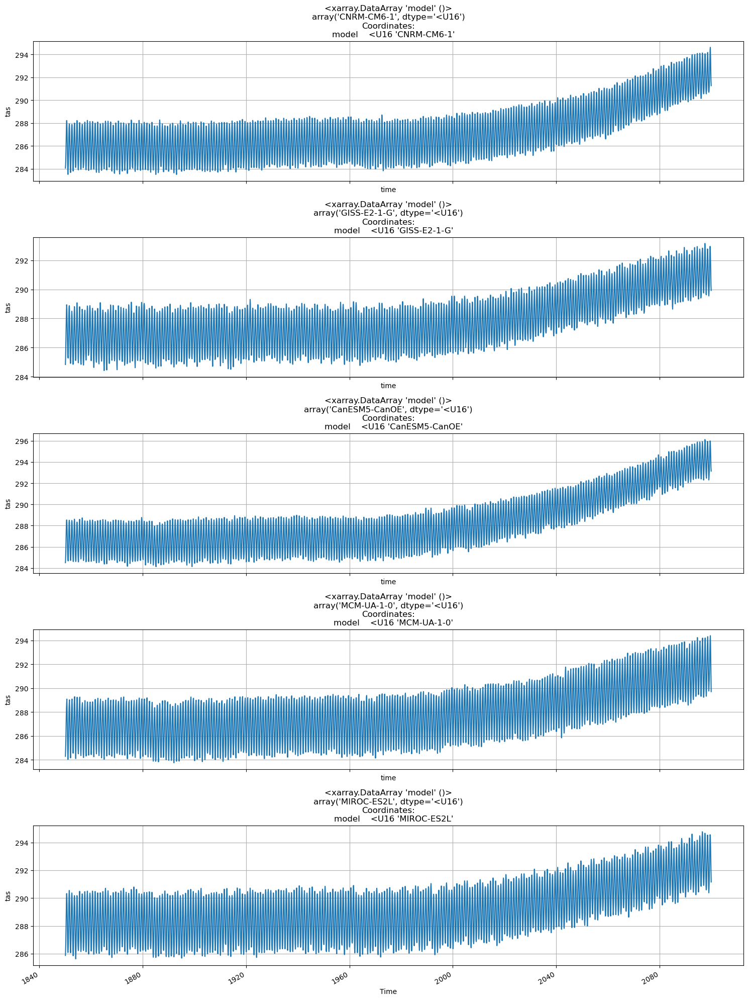

In [74]:
plot_time_series(0,5,0,ds_all_45)

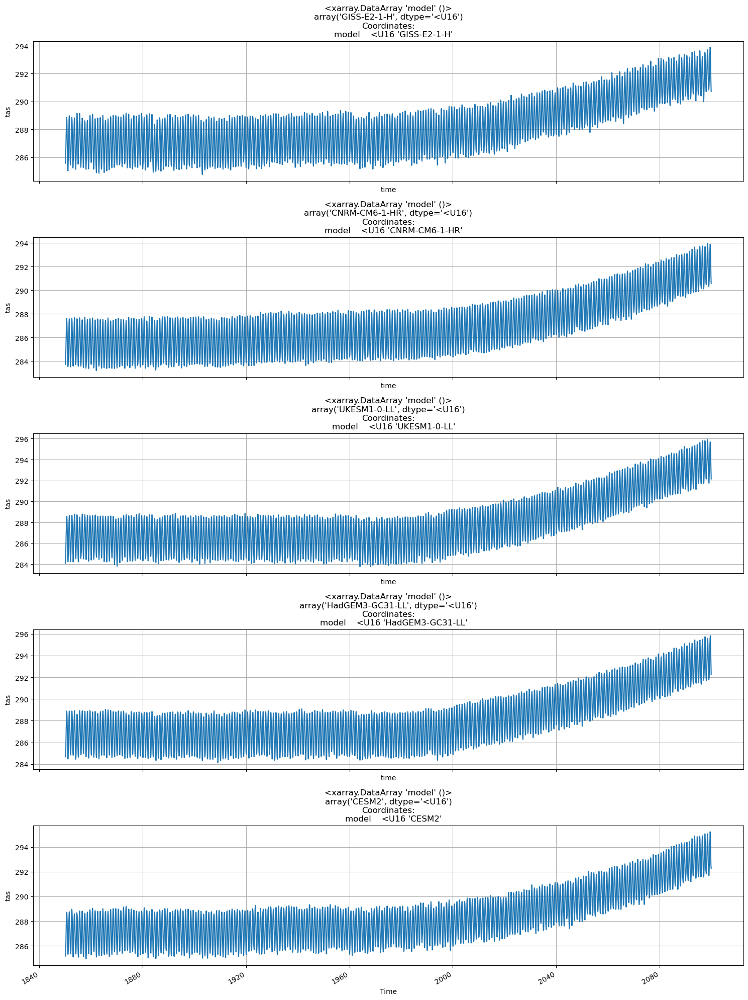

In [75]:
plot_time_series(0,5,5,ds_all_45)

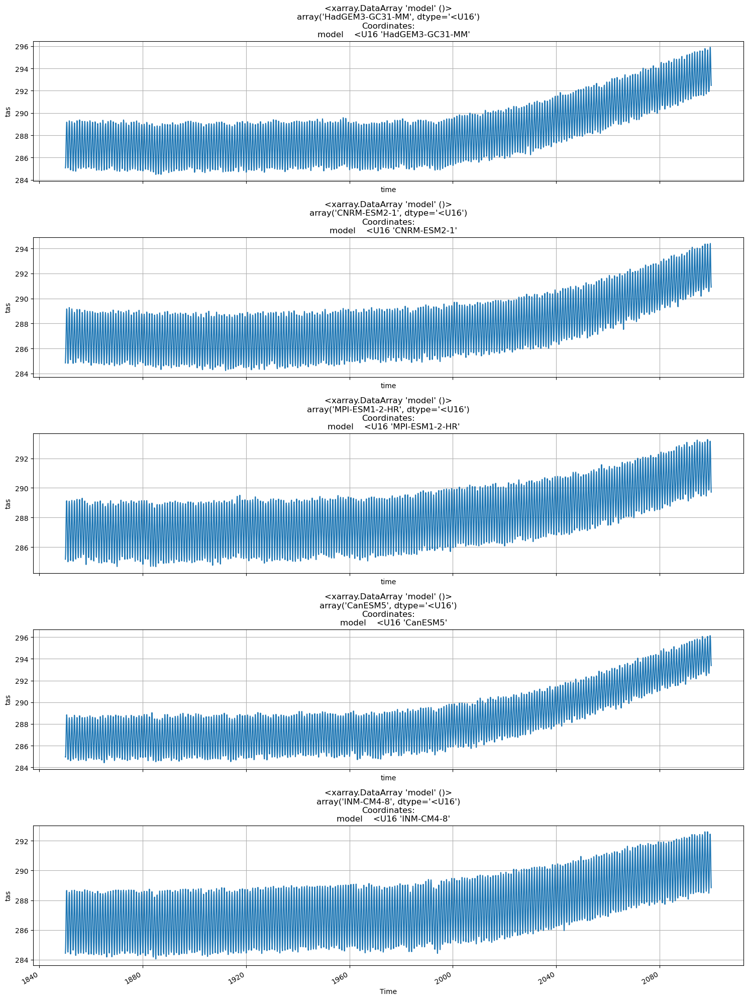

In [76]:
plot_time_series(0,5,10,ds_all_45)

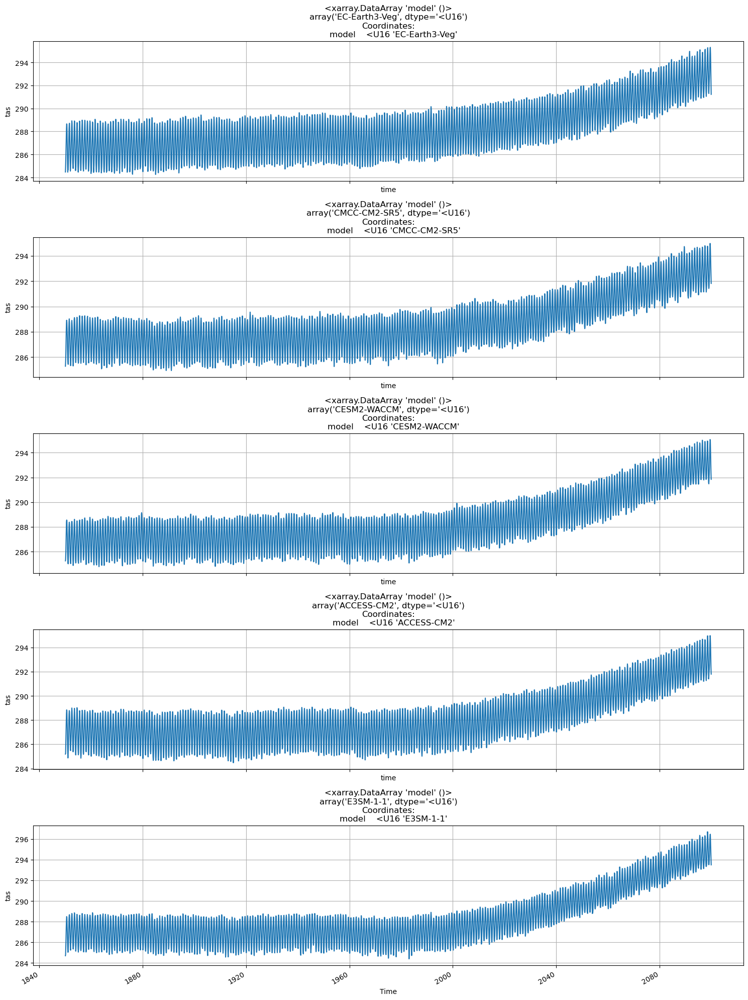

In [77]:
plot_time_series(0,5,15,ds_all_45)

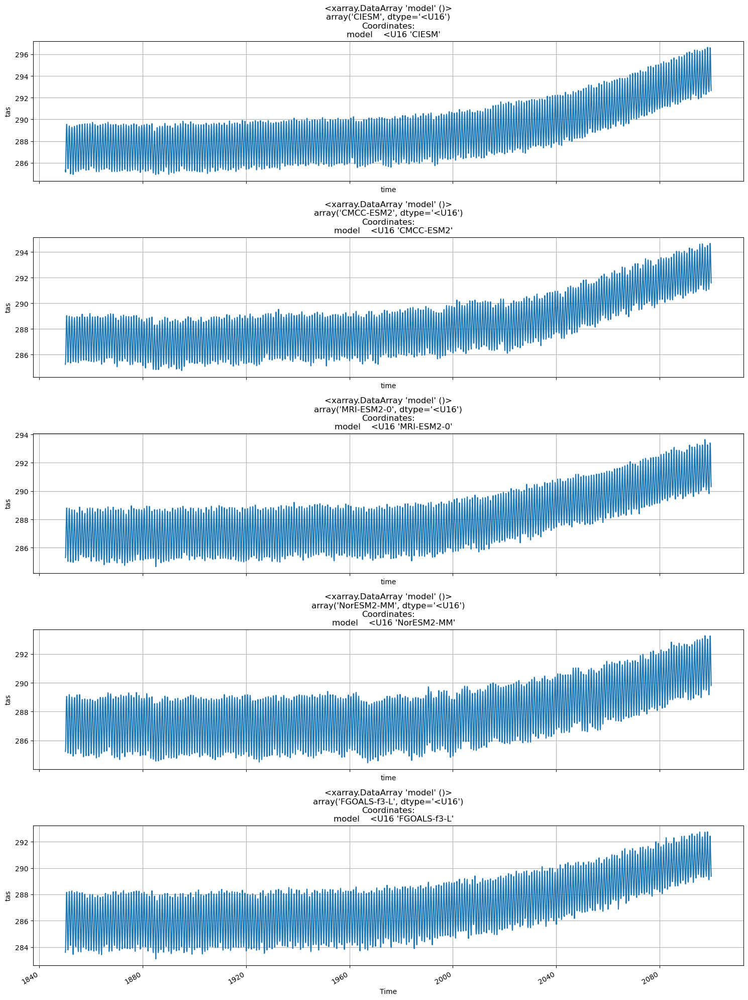

In [78]:
plot_time_series(0,5,20,ds_all_45)

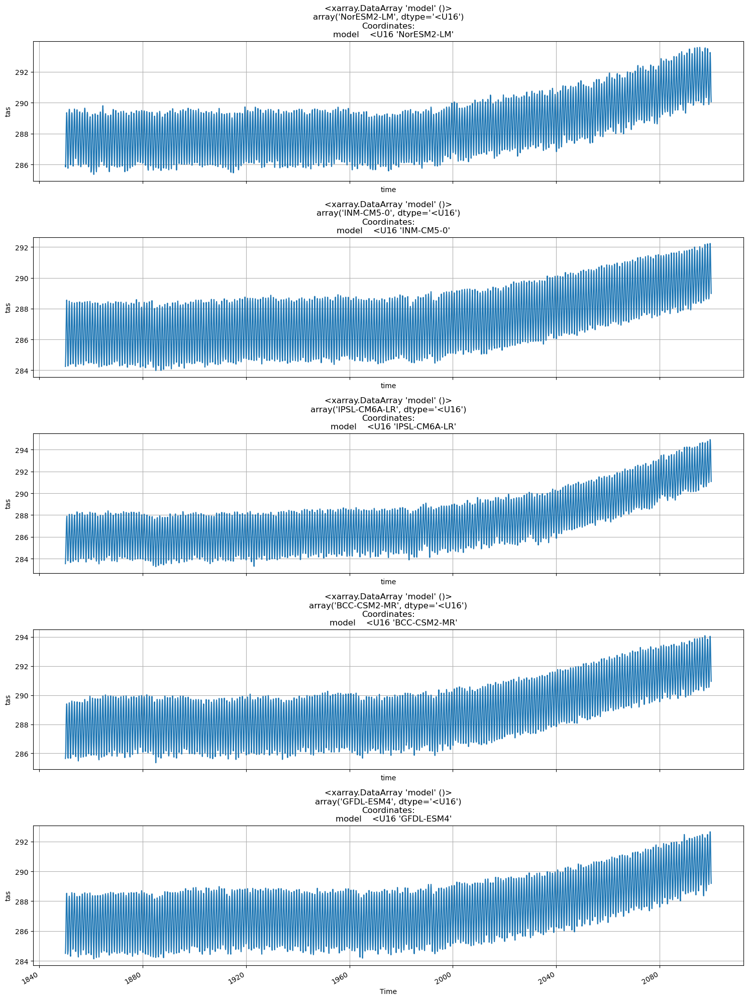

In [79]:
plot_time_series(0,5,25,ds_all_45)

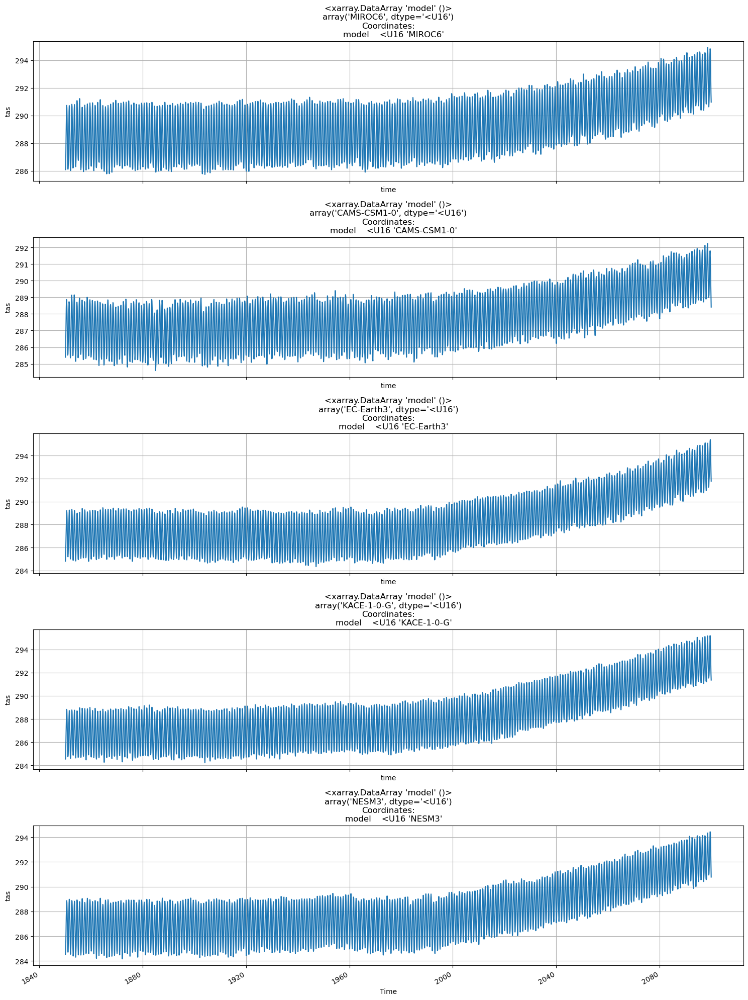

In [80]:
plot_time_series(0,5,30,ds_all_45)

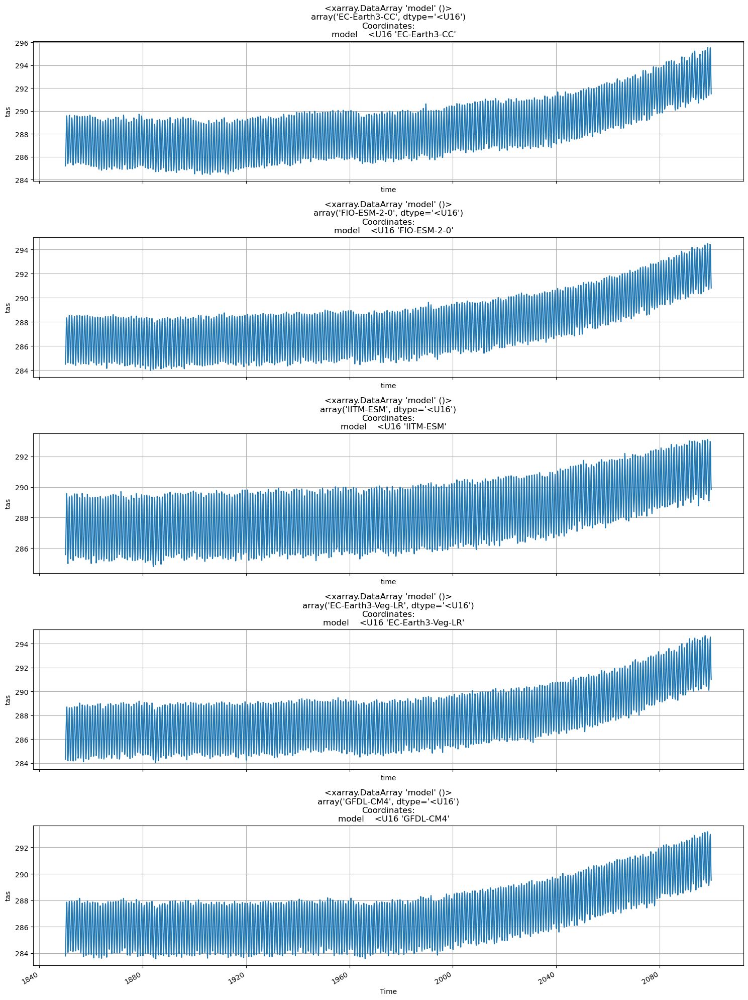

In [81]:
plot_time_series(0,5,35,ds_all_45)

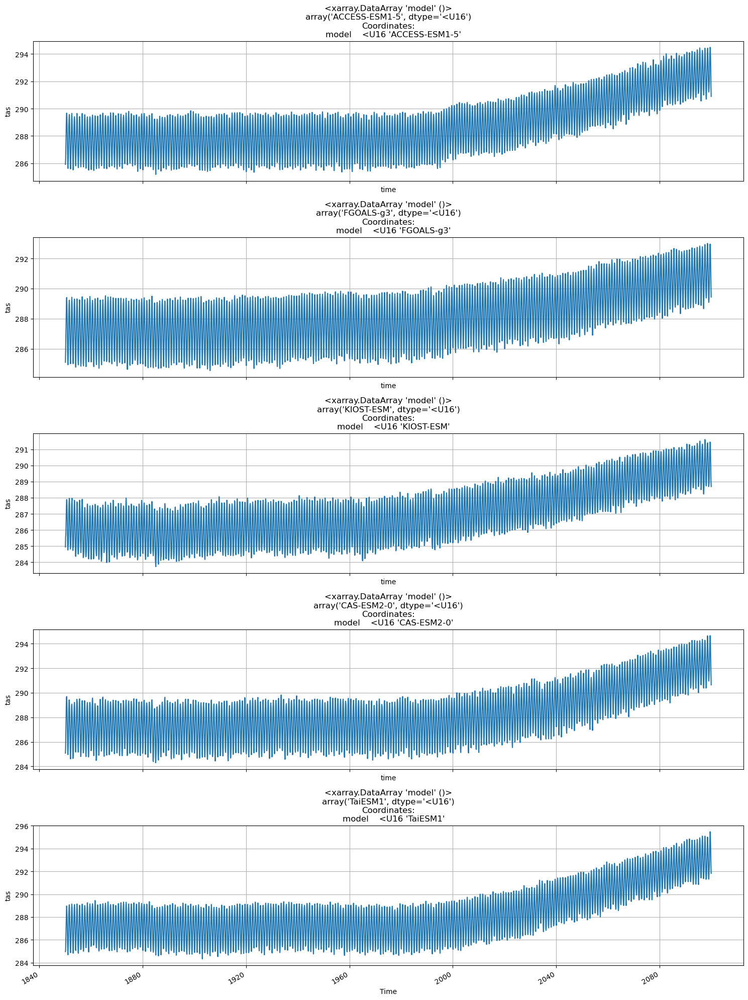

In [82]:
plot_time_series(0,5,40,ds_all_45)

### 1.3 Compute Monthly Anomalies

In [82]:
#remove seasonal cycle
ds_all_models_anom = ds_all_45.tas.groupby('time.month') - ds_all_45.tas.groupby('time.month').mean('time')
#remove baseline: remove avg temp from 1850 to 1900
#ensure that what we are plotting are monthly anomalies relative to an 1850-1900 baseline
ds_all_models_anom = ds_all_models_anom - ds_all_models_anom.sel(time=slice('1850','1900')).mean('time')
ds_all_models_anom

C:\Users\panda\miniconda3\envs\temp_var\Lib\site-packages\xarray\core\indexing.py:1443: PerformanceWarning: Slicing with an out-of-order index is generating 250 times more chunks
  return self.array[key]


<xarray.DataArray 'tas' (model: 45, time: 3000)>
dask.array<sub, shape=(45, 3000), dtype=float64, chunksize=(1, 1), chunktype=numpy.ndarray>
Coordinates:
  * time     (time) datetime64[ns] 1850-01-31 1850-02-28 ... 2099-12-31
  * model    (model) <U16 'CNRM-CM6-1' 'GISS-E2-1-G' ... 'INM-CM4-8'
    month    (time) int64 1 2 3 4 5 6 7 8 9 10 11 ... 2 3 4 5 6 7 8 9 10 11 12

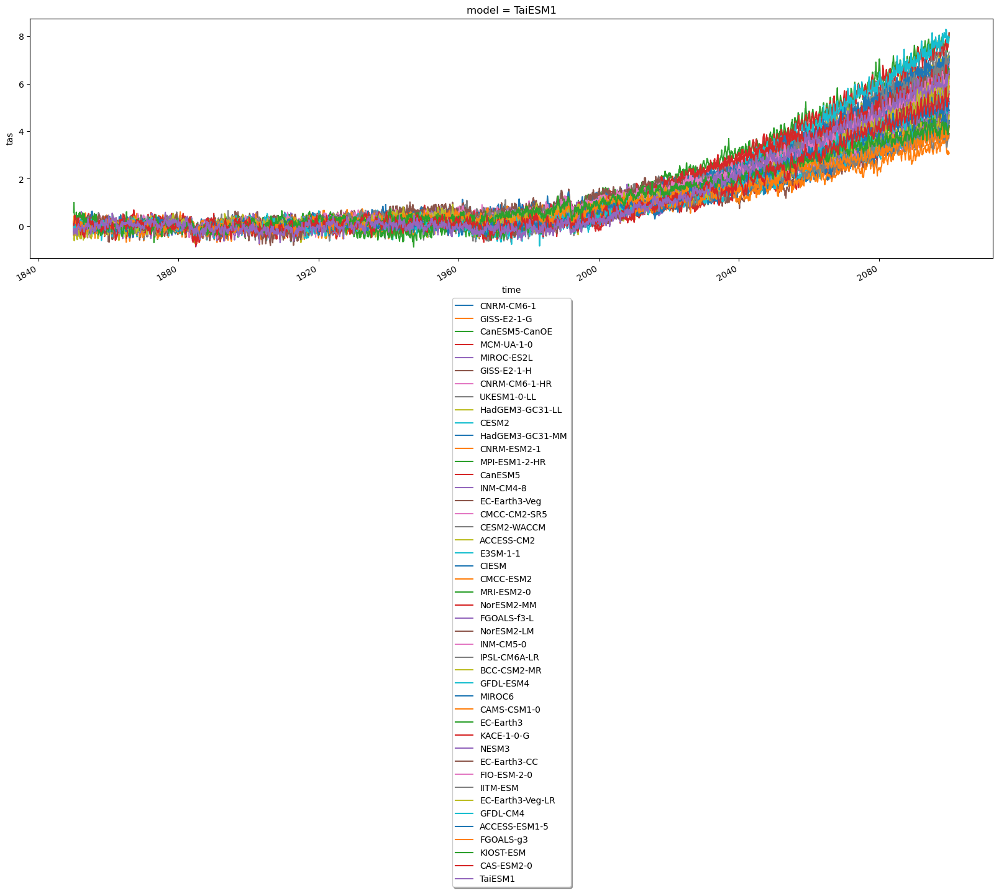

In [85]:
#redo figure with the model legend name on the bottom
fig, ax = plt.subplots(figsize=(20,5))
# Plot each line separately and collect the lines and labels
handles = []
labels = []
for m in ds_all_models_anom.model.values:
    line = ds_all_models_anom.sel(model=m).plot.line(ax=ax, x='time', hue='model', add_legend=False)
    handles.append(Line2D([], [], color=line[0].get_color(), label=m))  # Create Line2D handle
    labels.append(m)
ax.legend(handles=handles, labels=labels, loc='upper center', bbox_to_anchor=(0.5, -0.15), fancybox=True, shadow=True)

In [83]:
#saving to netcdf file
ds_all_45.to_netcdf("CMIP6_processed_tas_global_ssp585_data_2025-03-26.nc", mode = 'w', format = "NETCDF4", engine = 'netcdf4')